(section:clustering-validation)=
# Robustness of the Leiden clustering

## Assessing variability using clustroids

We now have a clustering of our data points; however, we wanted to assess the robustness of the clustering. For this, we used medoids, which are clustroids generated from the mean of each cluster. 

We will perform cross validation of the previous clustering by :
- Splitting the data into 5 folds
- For each fold, we compute the Leiden clustering from scratch and assign a cluster to each training point.
- We compute the clustroids in the **original UMAP embedding** space (using all data points, not just the ones in the fold). This is to make clusterings comparable across folds : we show the clustering assignments of the training points in a consistent latent space.
- We use k-nearest neighbors to assign each test point to a cluster, again in the original UMAP embedding space.
- We obtain test clustroids by computing the mean of each cluster in the test set.

For now, we simply show the original clustroids in the entire dataset.

In [1]:
import pandas as pd
import numpy as np

from pathlib import Path
import utils

# dimensionality reduction
from sklearn.decomposition import PCA
from umap import umap_ as UMAP

# plotting
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()

# clustering
from leiden_clustering import LeidenClustering

import utils

In [2]:
DATA_PATH = Path.cwd() / "../data"
FIG_PATH = Path.cwd() / "../src"
FILTER_TIMEOUT = False
if FILTER_TIMEOUT:
    FIG_PATH = FIG_PATH / "figures/leiden/"
else:
    FIG_PATH = FIG_PATH / "figures/leiden_with_timeout/"
FIG_PATH = FIG_PATH.resolve()
print(f"Figure path: {FIG_PATH}")
data = {
    Path(f).stem: pd.read_csv(f, index_col=0) for f in DATA_PATH.glob("combined_*.csv")
}
print(list(data.keys()))
if not FIG_PATH.exists():
    FIG_PATH.mkdir(parents=True)

EXPORT = False

Figure path: C:\Users\Cyril\Desktop\Code\ada-2023-project-adamants\src\figures\leiden_with_timeout
['combined_metrics_finished_edges', 'combined_metrics_finished_paths', 'combined_metrics_unfinished_edges', 'combined_metrics_unfinished_paths']


## Reproducibility

First, we will reproduce the results of the previous clustering and find the medoids using all the data.

In [3]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)

features_unfinished_paths = features_unfinished_paths[
    features_unfinished_paths["type"] != "timeout"
]


# extra step used for stratified sampling
features_unfinished_paths["origin"] = "unfinished"
features_finished_paths["origin"] = "finished"

In [4]:
combined_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
combined_df["finished"] = [1] * len(features_finished_paths) + [0] * len(
    features_unfinished_paths
)
combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING] = utils.normalize_features(
    combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
)

In [5]:
X = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy()
print(X.columns)
X = X.values
# find number of NaNs in each column
nans = np.isnan(X).sum(axis=0)
print(nans)
# drop rows with NaNs
X = X[~np.isnan(X).any(axis=1)]

Index(['durationInSec', 'backtrack', 'numberOfPath', 'position_mean',
       'position_std', 'path_length', 'coarse_mean_time',
       'semantic_similarity', 'ratio', 'path_closeness_abs_sum'],
      dtype='object')
[0 0 3 0 0 0 0 0 0 0]


In [6]:
# fix seed for reproducibility
np.random.seed(1)
clustering = LeidenClustering(
    leiden_kws={"n_iterations": -1, "seed": 0, "resolution_parameter": 0.2},
    pca_kws={"n_components": 7},
)
clustering.fit(X)
clustering.labels_

c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:346: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\numba\core\types\functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")


c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:348: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numb

array([0, 1, 1, ..., 0, 3, 0])

In [7]:
# UMAP
umap = UMAP.UMAP(n_components=3, metric="euclidean")
result_umap_euc = umap.fit_transform(X)

c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:346: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numba-captured-errors
Exception origin:
  File "c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\numba\core\types\functions.py", line 486, in __getnewargs__
    raise ReferenceError("underlying object has vanished")


c:\Users\Cyril\anaconda3\envs\DLbiomed\lib\site-packages\pynndescent\pynndescent_.py:348: NumbaPendingDeprecationWarning:

Code using Numba extension API maybe depending on 'old_style' error-capturing, which is deprecated and will be replaced by 'new_style' in a future release. See details at https://numba.readthedocs.io/en/latest/reference/deprecation.html#deprecation-of-old-style-numb

In [8]:
X_w_clusters = pd.concat(
    [
        combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
        .dropna()
        .reset_index(drop=True),
        pd.DataFrame({"cluster": clustering.labels_}),
        pd.DataFrame(result_umap_euc, columns=["umap_1", "umap_2", "umap_3"]),
    ],
    axis=1,
)
# X_w_clusters

In [9]:
# find the clustroid of each cluster
clustroids = []
for cluster in np.unique(clustering.labels_):
    clustroid = X_w_clusters[X_w_clusters["cluster"] == cluster].mean()
    clustroids.append(clustroid)
clustroids = pd.DataFrame(clustroids)
clustroids

,durationInSec,backtrack,numberOfPath,position_mean,position_std,path_length,coarse_mean_time,semantic_similarity,ratio,path_closeness_abs_sum,cluster,umap_1,umap_2,umap_3
0,0.424659,-0.283879,-0.360384,0.399034,0.546873,0.257930,0.529426,-0.118988,0.432146,0.235192,0.0,1.089718,2.370224,3.910013
1,-0.437841,-0.250777,-0.314141,-0.574306,-0.352495,0.339709,-0.667307,0.414844,0.217711,-0.450524,1.0,0.638870,2.518832,3.230923
2,-0.717510,-0.214685,-0.250738,-0.119958,-0.742841,-1.142415,-0.174853,-0.282738,-1.251060,0.405756,2.0,9.072618,1.501182,6.086436
3,0.916725,1.533694,-0.035864,0.174894,0.323838,0.561424,0.209586,-0.036058,0.398022,-0.574947,3.0,0.927876,2.925985,5.234965
4,-0.236821,-0.196367,2.127195,-0.096609,0.021772,0.026851,-0.245901,0.142964,0.143711,0.107448,4.0,2.523256,1.447267,4.649573


### Plot of the clustroids in UMAP space

In [10]:
from plotly import graph_objects as go

fig_clusters = px.scatter_3d(
    result_umap_euc,
    x=0,
    y=1,
    z=2,
    color=clustering.labels_.astype(str),
    title="UMAP, clustering by leiden_clustering, with clustroids",
    # reduce size points
    size_max=0.1,
    # make scatter alpha = 0.1
    opacity=0.01,
)
fig_clusters.add_trace(
    go.Scatter3d(
        x=clustroids["umap_1"],
        y=clustroids["umap_2"],
        z=clustroids["umap_3"],
        mode="markers",
        marker=dict(
            size=10,
            symbol="cross",
            color="white"
            # color=clustering.labels_.astype(str),
        ),
        name="Clustroids",
    )
)
utils.format_3d_plot(fig_clusters)

if EXPORT:
    fig_clusters.write_html(FIG_PATH / "umap_w_clustroids.html")

display(fig_clusters)

In [11]:
N_FOLDS = 5
N_CLUSTERS = 5
features_used = utils.FEATURES_COLS_USED_FOR_CLUSTERING

## 5-fold cross validation

Here we perform the 5-fold cross validation described above.

It is important to note that due to some randomness in the clustering algorithm, we perform a dichotomic search-like hyperparameter sweep to ensure that the number of clusters is the same across folds.

This is simply to ensure that the clusterings are comparable across folds; we have decided it was beyond the scope of this project to explore the differences in the number of clusters across folds, their reasons for appearing and their individual relevance.

In [12]:
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier

kfold = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=1)

clustering_train_results = {}
clustering_test_results = {}
clustroids_train_results = {}
clustroids_test_results = {}

# run clustering on each fold, stratified by origin
cv_combined_df = combined_df.copy()[features_used + ["origin"]].dropna()
for fold, (train_idx, test_idx) in enumerate(
    kfold.split(cv_combined_df[features_used], cv_combined_df["origin"])
):
    print(f"Fold {fold}")
    X_train = cv_combined_df.iloc[train_idx][features_used].values
    X_test = cv_combined_df.iloc[test_idx][features_used].values

    print(f"Trains set : {X_train.shape}")
    print(f"Test set : {X_test.shape}")

    # find resolution parameter that leads to the previous number of clusters
    repeat = True
    resolution_parameter = 0.2
    resolution_parameters = [0.2]
    step=0.02
    while repeat:
        # fix seed for reproducibility
        print("Clustering train set")
        np.random.seed(1)
        train_clustering = LeidenClustering(
            leiden_kws={"n_iterations": -1, "seed": 0, "resolution_parameter": resolution_parameter},
            pca_kws={"n_components": 7},
        )
        train_clustering.fit(X_train)
        unique_labels=np.unique(train_clustering.labels_)
        print(f"Resolution parameter: {resolution_parameter}, n groups: {len(unique_labels)}")
        if len(unique_labels) == N_CLUSTERS:
            repeat = False
        # too many clusters, decrease resolution parameter
        elif len(unique_labels) > N_CLUSTERS:
            if resolution_parameter - step <= 0:
                #send error message
                raise ValueError("Could not find a resolution parameter that does not lead to more clusters than expected")
            if resolution_parameter - step in resolution_parameters:
                step=step/2.
            resolution_parameter -= step
        # too few clusters, increase resolution parameter
        else:
            if resolution_parameter + step >= 1:
                #send error message
                raise ValueError("Could not find a resolution parameter that does not lead to less clusters than expected")
            if resolution_parameter + step in resolution_parameters:
                step=step/2.
            resolution_parameter += step
        resolution_parameters.append(resolution_parameter)
            

        

    X_train_w_clusters = pd.concat(
        [
            combined_df[features_used].iloc[train_idx].dropna().reset_index(drop=True),
            pd.DataFrame({"cluster": train_clustering.labels_}),
            pd.DataFrame(
                result_umap_euc[train_idx], columns=["umap_1", "umap_2", "umap_3"]
            ),
        ],
        axis=1,
    )
    clustering_train_results[fold] = X_train_w_clusters
    # compute train clustroids
    print("Computing train clustroids")
    train_clustroids = []
    for cluster in np.unique(train_clustering.labels_):
        clustroid = X_train_w_clusters[X_train_w_clusters["cluster"] == cluster].mean()
        train_clustroids.append(clustroid)
    train_clustroids = pd.DataFrame(train_clustroids)
    clustroids_train_results[fold] = train_clustroids

    # test clustering using nearest neighbors
    print("Clustering test set using nearest neighbors")
    test_clustering = KNeighborsClassifier(n_neighbors=20)
    # fit on UMAP embeddings
    test_clustering.fit(result_umap_euc[train_idx], train_clustering.labels_)
    # predict on UMAP embeddings
    test_clustering.labels_ = test_clustering.predict(result_umap_euc[test_idx])

    X_test_w_clusters = pd.concat(
        [
            combined_df[features_used].iloc[test_idx].dropna().reset_index(drop=True),
            pd.DataFrame({"cluster": test_clustering.labels_}),
            pd.DataFrame(
                result_umap_euc[test_idx], columns=["umap_1", "umap_2", "umap_3"]
            ),
        ],
        axis=1,
    )
    clustering_test_results[fold] = X_test_w_clusters
    # find the clustroid of each cluster
    print("Computing test clustroids")
    test_clustroids = []
    for cluster in np.unique(train_clustering.labels_):
        clustroid = X_test_w_clusters[X_test_w_clusters["cluster"] == cluster].mean()
        test_clustroids.append(clustroid)
    test_clustroids = pd.DataFrame(test_clustroids)
    clustroids_test_results[fold] = test_clustroids
    colors = {
        "0": "red",
        "1": "blue",
        "2": "green",
        "3": "yellow",
        "4": "purple",
        "5": "orange",
    }
    # Train plot
    # fig = px.scatter_3d(
    #     result_umap_euc[train_idx],
    #     x=0,
    #     y=1,
    #     z=2,
    #     color=[colors[str(c)] for c in train_clustering.labels_],
    #     title=f"Train : UMAP, clustering by leiden_clustering\nFold {fold}",
    #     # reduce size points
    #     size_max=0.1,
    #     opacity=0.1,
    # )
    # fig
    # # Test plot
    # fig = px.scatter_3d(
    #     result_umap_euc[test_idx],
    #     x=0,
    #     y=1,
    #     z=2,
    #     color=[colors[str(c)] for c in test_clustering.labels_],
    #     title=f"Test : UMAP, clustering by leiden_clustering\nFold {fold}",
    #     # reduce size points
    #     size_max=0.1,
    #     opacity=0.1,
    # )
    # fig
    print("_" * 80)

Fold 0
Trains set : (50493, 10)
Test set : (12624, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 5
Computing train clustroids
Clustering test set using nearest neighbors
Computing test clustroids
________________________________________________________________________________
Fold 1
Trains set : (50493, 10)
Test set : (12624, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 5
Computing train clustroids
Clustering test set using nearest neighbors
Computing test clustroids
________________________________________________________________________________
Fold 2
Trains set : (50494, 10)
Test set : (12623, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 5
Computing train clustroids
Clustering test set using nearest neighbors
Computing test clustroids
________________________________________________________________________________
Fold 3
Trains set : (50494, 10)
Test set : (12623, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 5
Comput

## Assessing the variability of the clustering across folds

**We now face a problem linked to the implementation of Leiden clustering**: the cluster labels are not consistent across folds.

Therefore, if we now try to compare distributions of cluster features across folds, we will not be able to compare properly the clusters.

Below we show the means of each feature across clusters, for each fold; where the issue is readily apparent.

### Train set features means across folds

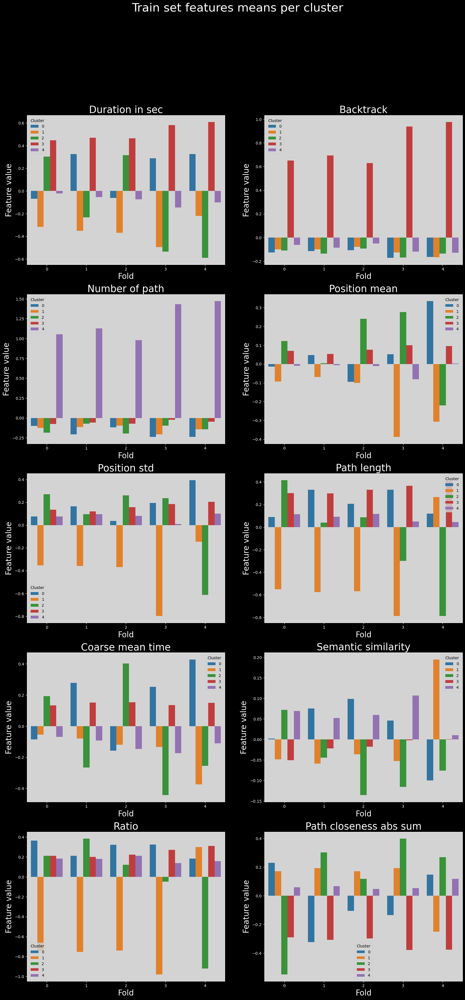

In [13]:
# barplot of the mean of each feature for all the train sets
for fold, df in clustering_train_results.items():
    df["fold"] = fold
train_features_df = pd.concat(clustering_train_results.values(), axis=0)
train_features_df = train_features_df.groupby(["fold", "cluster"]).mean().reset_index()
with plt.style.context("dark_background"):
    fig, axs = plt.subplots(5, 2, figsize=(20, 40))
    fig.suptitle("Train set features means per cluster", fontsize=30)
    axs = axs.flatten()
    for i, feature in enumerate(features_used):
        sns.barplot(
            data=train_features_df,
            x="fold",
            y=feature,
            hue="cluster",
            errorbar="ci",
            palette="tab10",
            ax=axs[i],
        )
        axs[i].set_xlabel("Fold", fontsize=20)
        axs[i].set_ylabel("Feature value", fontsize=20)
        axs[i].set_title(utils.get_feature_names_labels()[i], fontsize=25)
        utils.set_axis_style(axs, i, add_xlabel=False, add_ylabel=False)

### Test set features means across folds

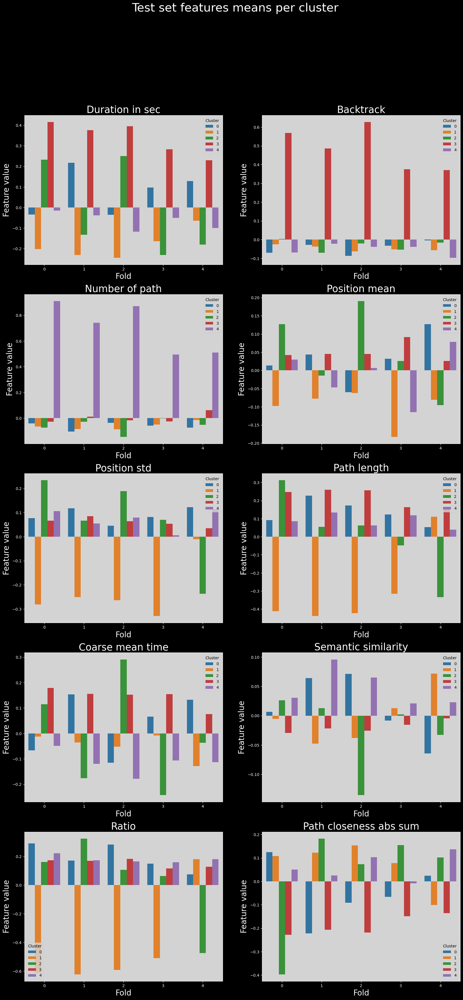

In [14]:
for fold, df in clustering_test_results.items():
    df["fold"] = fold
test_features_df = pd.concat(clustering_test_results.values(), axis=0)
test_features_df = test_features_df.groupby(["fold", "cluster"]).mean().reset_index()
test_features_df
with plt.style.context("dark_background"):
    fig, axs = plt.subplots(5, 2, figsize=(20, 40))
    fig.suptitle("Test set features means per cluster", fontsize=30)
    axs = axs.flatten()
    for i, feature in enumerate(features_used):
        sns.barplot(
            data=test_features_df,
            x="fold",
            y=feature,
            hue="cluster",
            errorbar="ci",
            palette="tab10",
            ax=axs[i],
        )
        axs[i].set_xlabel("Fold", fontsize=20)
        axs[i].set_ylabel("Feature value", fontsize=20)
        axs[i].set_title(utils.get_feature_names_labels()[i], fontsize=25)
        utils.set_axis_style(axs, i, add_xlabel=False, add_ylabel=False)
plt.show()

In [15]:
for fold in range(len(clustroids_test_results)):
    clustroids_test_results[fold]["fold"] = fold

clustroids_test_results_tmp = pd.concat(clustroids_test_results.values()).copy()
test_clustroids = clustroids_test_results_tmp.groupby(["fold", "cluster"]).mean()
clustroid_coordinates = test_clustroids[["umap_1", "umap_2", "umap_3"]]
display(clustroid_coordinates)

umap_1    umap_2    umap_3
fold cluster                              
0    0.0     -0.222507  2.921545  2.095573
     1.0      9.051306  1.097376  6.595613
     2.0      0.442238  2.191711  4.916422
     3.0      0.669249  3.365278  5.732391
     4.0      2.470189  1.275109  5.818295
1    0.0      0.530229  2.504511  4.375679
     1.0      9.091880  1.020848  6.567221
     2.0     -0.368833  2.894123  1.754738
     3.0      0.708486  3.349034  5.666735
     4.0      2.836004  1.284972  5.769408
2    0.0     -0.365075  2.969920  3.141656
     1.0      9.204134  1.119922  6.536933
     2.0      1.696871  1.903363  3.706254
     3.0      0.605741  3.364125  5.894669
     4.0      2.748121  1.368847  5.572644
3    0.0      0.513959  2.769251  4.130853
     1.0      9.431116  2.101022  6.301825
     2.0      2.482135  0.742329  2.370551
     3.0      0.700518  3.404507  5.635223
     4.0      2.801880  1.372310  5.619553
4    0.0      1.665734  1.934040  4.097106
     1.0     -0.250267  2.904638  2.904988
     2.0      9.432258  1.526280  6.356268
     3.0      0.516477  3.354327  5.775280
     4.0      2.868383  1.415569  5.682860

## Matching to the rescue

However, there is a way to prevent this issue : matching. To do this, we can assign the clustroids for a given cluster in a fold to the closest clustroids across other folds. 
This way, we can compare the clusters by assigning them to other clusters that are likely the same.

Note that this is done in the UMAP embedding space, not in the original space.

We can then verify the correctness of the matching by looking at the distribution of the features for the matched clusters, which should now be similar across folds.

In [16]:
nearest_clustroids = {}
# report which cluster to match with which in other folds
# in the format (fold_i, cluster_i) : {fold_j1, cluster_j1, distance_j1}, {fold_j2, cluster_j2, distance_j2}, ...
# of shape n_folds x n_clusters x n_clusters-1
for fold_i in range(N_FOLDS):
    for cluster_i in range(N_CLUSTERS):
        nearest_clustroids[(fold_i, cluster_i)] = []
        for fold_j in range(N_FOLDS):
            if fold_i == fold_j:
                continue
            distances = {}
            for cluster_j in range(N_CLUSTERS):
                distances[fold_j, cluster_j] = np.linalg.norm(
                    clustroid_coordinates.loc[fold_i, cluster_i]
                    - clustroid_coordinates.loc[fold_j, cluster_j]
                )
            # find minimum distance and append according to format
            # print(list(distances.values()))
            min_dist_id = np.argmin(list(distances.values()))
            nearest_clustroids[(fold_i, cluster_i)].append(
                (fold_j, min_dist_id, distances[fold_j, min_dist_id])
            )
display(nearest_clustroids)

{(0, 0): [(1, 2, 0.37193030254210946),
  (2, 0, 1.056860421247269),
  (3, 0, 2.1697784798021984),
  (4, 1, 0.8100669845921427)],
 (0, 1): [(1, 1, 0.09115345593678542),
  (2, 1, 0.16525172329922452),
  (3, 1, 1.112597436958438),
  (4, 2, 0.6215858651214851)],
 (0, 2): [(1, 0, 0.6308637105170848),
  (2, 3, 1.5356598760667617),
  (3, 0, 0.9776578754888323),
  (4, 3, 1.4473503508557508)],
 (0, 3): [(1, 3, 0.07819346147005983),
  (2, 3, 0.17426572509453697),
  (3, 3, 0.10935397515289522),
  (4, 3, 0.15905545956814562)],
 (0, 4): [(1, 4, 0.36919928640238986),
  (2, 4, 0.3825924393202428),
  (3, 4, 0.3987045063915007),
  (4, 4, 0.44342962152006804)],
 (1, 0): [(0, 2, 0.6308637105170848),
  (2, 2, 1.4732837075211924),
  (3, 0, 0.36095951301559276),
  (4, 0, 1.3009280165802424)],
 (1, 1): [(0, 1, 0.09115345593678542),
  (2, 1, 0.15275502724581208),
  (3, 1, 1.162881631275063),
  (4, 2, 0.6448412188120699)],
 (1, 2): [(0, 0, 0.37193030254210946),
  (2, 0, 1.3889926056258408),
  (3, 0, 2.53788065

In [17]:
# make a dataframe that shows for folds : cluster_from, cluster_to, fold, distance
matched_df = pd.DataFrame(
    columns=["fold_from", "cluster_from", "fold_to", "cluster_to", "distance"]
)
for fold_i in range(N_FOLDS):
    for cluster_i in range(N_CLUSTERS):
        for fold_j, cluster_j, distance in nearest_clustroids[(fold_i, cluster_i)]:
            matched_df = pd.concat(
                [
                    matched_df,
                    pd.DataFrame(
                        {
                            "fold_from": [fold_i],
                            "cluster_from": [cluster_i],
                            "fold_to": [fold_j],
                            "cluster_to": [cluster_j],
                            "distance": [distance],
                        }
                    ),
                ]
            )
display(matched_df)

,fold_from,cluster_from,fold_to,cluster_to,distance
0,0,0,1,2,0.371930
0,0,0,2,0,1.056860
0,0,0,3,0,2.169778
0,0,0,4,1,0.810067
0,0,1,1,1,0.091153
...,...,...,...,...,...
0,4,3,3,3,0.236654
0,4,4,0,4,0.443430
0,4,4,1,4,0.159983
0,4,4,2,4,0.169687


In [18]:
def extract_fold_coordinates(fold, matched_df=matched_df):
    matched_df = matched_df.loc[matched_df["fold_from"] == fold]
    coordinates_matched = []
    for cluster_from in matched_df["cluster_from"].unique():
        coordinates_matched.append([clustroid_coordinates.loc[fold, cluster_from]])
        other_coords = [
            clustroid_coordinates.loc[
                matched_df.loc[
                    (matched_df["cluster_from"] == cluster_from)
                    & (matched_df["cluster_to"] == cluster_to)
                ]["fold_to"].values[0],
                cluster_to,
            ]
            for cluster_to in matched_df.loc[
                (matched_df["cluster_from"] == cluster_from)
            ]["cluster_to"].values
        ]
        coordinates_matched[-1].extend(other_coords)
    coordinates_matched = np.array(
        coordinates_matched
    )  # shape is N_FOLDS x N_CLUSTERS x 3
    coordinates_matched = pd.DataFrame(
        coordinates_matched.reshape(N_CLUSTERS * N_FOLDS, 3),
        columns=["umap_1", "umap_2", "umap_3"],
    )
    coordinates_matched["cluster"] = np.repeat(np.arange(N_CLUSTERS), N_FOLDS)
    return coordinates_matched


coordinates_matched_fold0 = extract_fold_coordinates(0)

### Plot of clustroids variation across folds

Now that we have matched the clusters, we can start comparing them across folds.
In the following plot, we show the clustroids of each fold, matched to the clustroids of the fourth fold. 
The clustroids are overall similar across folds, and match the ones in the original clustering in the data, demonstrating a degree of robustness of the clustering.

In [19]:
# we use the fourth fold as it contains the best matchings
coordinates_matched_fold4 = extract_fold_coordinates(4)
fig = px.scatter_3d(
    coordinates_matched_fold4,
    x="umap_1",
    y="umap_2",
    z="umap_3",
    color=coordinates_matched_fold4["cluster"].astype(str),
    title=f"Variability of clustroids across folds",
    opacity=0.7,
    symbol=list(range(5)) * 5,
    # color_continuous_scale=px.colors.sequential.haline,
)
fig.add_trace(
    go.Scatter3d(
        x=clustroids["umap_1"],
        y=clustroids["umap_2"],
        z=clustroids["umap_3"],
        mode="markers",
        marker=dict(
            size=10,
            symbol="cross",
            color="black"
            # color=clustering.labels_.astype(str),
        ),
        name="Original clustroids",
    )
)

fig.update_layout(
    {"plot_bgcolor": "#14181e", "paper_bgcolor": "#14181e"}
)
fig.update_layout(font_color="white")
fig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
    )
)
fig.update_layout(legend_title_text="Cluster")
fig.update_layout(
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3")
)
fig.update_layout(
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01,
        font=dict(color="white"),
        bgcolor="rgba(0,0,0,0)",
        title=dict(text="Fold", font=dict(color="white")),
    )
)

if EXPORT:
    fig.write_html(FIG_PATH / "clustroids_variability.html")

display(fig)

Comparing the above figure with the original clustering, we can see that the variaibility of clustroids across folds is relatively low, as they remain roughly in the same region of the embedding space.

In [20]:
matched_df_fold4 = matched_df.loc[matched_df["fold_from"] == 4]
# display(matched_df_fold4)

# get the features using cluster matching from fold 4
features_matched = test_features_df
# reorder using the matched_df_fold4
# display(features_matched)
i = 0
matched_features_means = pd.DataFrame(columns=features_matched.columns)
for row in matched_df_fold4.iterrows():
    if i == row[1]["cluster_from"]:
        # append the row from fold 4
        new_row = (
            features_matched.loc[
                (features_matched["fold"] == 4)
                & (features_matched["cluster"] == row[1]["cluster_from"])
            ]
            .iloc[0]
            .to_dict()
        )
        # print(new_row)
        matched_features_means.loc[len(matched_features_means)] = new_row
        i += 1
    # find fold_to and cluster_to in fold and cluster columns of matched_df_fold4
    new_row = (
        features_matched.loc[
            (features_matched["fold"] == row[1]["fold_to"])
            & (features_matched["cluster"] == row[1]["cluster_to"])
        ]
        .iloc[0]
        .to_dict()
    )
    # print(new_row)
    matched_features_means.loc[len(matched_features_means)] = new_row
matched_features_means

,fold,cluster,durationInSec,backtrack,numberOfPath,position_mean,position_std,path_length,coarse_mean_time,semantic_similarity,ratio,path_closeness_abs_sum,umap_1,umap_2,umap_3
0,4.0,0.0,0.128477,-0.003097,-0.074372,0.126786,0.121787,0.053865,0.132193,-0.064552,0.073602,0.024466,1.665734,1.934040,4.097106
1,0.0,2.0,0.231577,0.004454,-0.073484,0.127134,0.233443,0.312482,0.114587,0.026263,0.161534,-0.396978,0.442238,2.191711,4.916422
2,1.0,0.0,0.217110,-0.028086,-0.103809,0.043844,0.116783,0.227241,0.154091,0.064086,0.171464,-0.221947,0.530229,2.504511,4.375679
3,2.0,2.0,0.249968,-0.020335,-0.145933,0.190363,0.188121,0.062080,0.291250,-0.135683,0.105230,0.072671,1.696871,1.903363,3.706254
4,3.0,0.0,0.097231,-0.032822,-0.058690,0.032180,0.081681,0.122511,0.066013,-0.008233,0.149466,-0.066274,0.513959,2.769251,4.130853
5,4.0,1.0,-0.063926,-0.055610,-0.015169,-0.080708,-0.010413,0.111005,-0.128595,0.071821,0.180073,-0.100466,-0.250267,2.904638,2.904988
6,0.0,0.0,-0.034107,-0.070394,-0.041902,0.013160,0.076710,0.091436,-0.066956,0.006308,0.290530,0.124542,-0.222507,2.921544,2.095573
7,1.0,2.0,-0.132791,-0.069731,-0.027119,-0.014553,0.065786,0.055099,-0.175973,0.012603,0.323879,0.182646,-0.368833,2.894122,1.754738
8,2.0,0.0,-0.035718,-0.085595,-0.036968,-0.060103,0.045504,0.172787,-0.115039,0.071317,0.281640,-0.091514,-0.365075,2.969920,3.141656
9,3.0,0.0,0.097231,-0.032822,-0.058690,0.032180,0.081681,0.122511,0.066013,-0.008233,0.149466,-0.066274,0.513959,2.769251,4.130853


## Variability of features across folds in matched clusters

Finally, we can compare the distributions of features across folds, in the matched clusters.

It is possible that due to how the matching was performed (using clustroid distances in the UMAP latent space generated from all data points), 
the clusters are not matched properly when we go back to feature space.

However, the distributions of features across folds are still very similar in most cases.

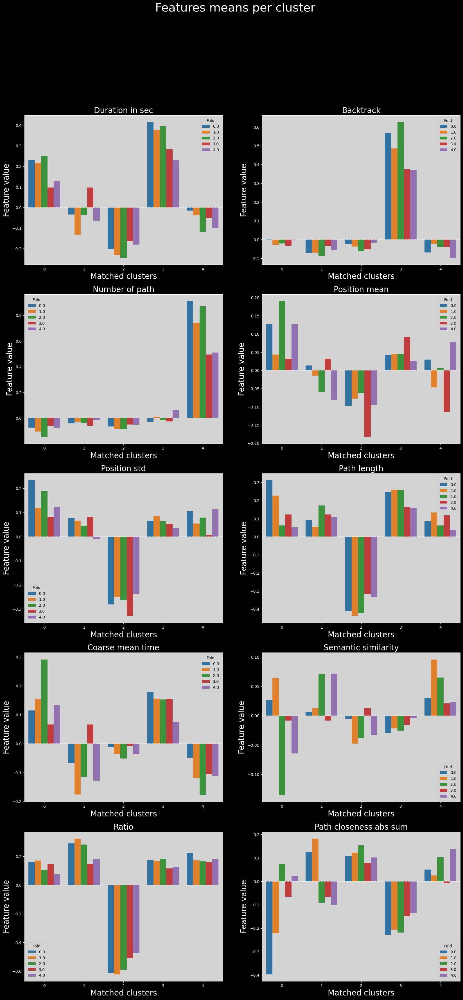

In [21]:
matched_features_means["matched_cluster"] = np.repeat(np.arange(5), 5)
feature_names_titles = utils.get_feature_names_labels()
with plt.style.context("dark_background"):
    # fig.tight_layout()
    # axs[-1].axis("off")
    fig, axs = plt.subplots(5, 2, figsize=(20, 40))
    axs = axs.flatten()
    for i, feature in enumerate(features_used):
        sns.barplot(
            data=matched_features_means,
            x="matched_cluster",
            y=feature,
            hue="fold",
            errorbar="ci",
            palette="tab10",
            ax=axs[i],
        )
        axs[i].axhline(y=0, color="white", linestyle="--", alpha=0.5)
        axs[i].set_xlabel("Matched clusters", fontsize=20)
        axs[i].set_ylabel("Feature value", fontsize=20)
        axs[i].set_title(feature_names_titles[i], fontsize=20)
        utils.set_axis_style(axs, i, add_xlabel=False, add_ylabel=False)
        leg = axs[i].get_legend()
        leg.set_title("Fold")

    # export with transparent background
    if EXPORT:
        fig.savefig(
            FIG_PATH / "CV_matched_clusters_feattures_means_results.png",
            transparent=True,
            bbox_inches="tight",
            pad_inches=0,
        )
    plt.suptitle("Features means per cluster", fontsize=30)
    # fig.tight_layout()
plt.show()

In [22]:
# same as above without subplots, FOR DATA STORY
################################################
# for i, feature in enumerate(features_used):
#     plt.figure(figsize=(20, 10))
#     sns.barplot(
#         data=matched_features_means,
#         x="matched_cluster",
#         y=feature,
#         hue="fold",
#         errorbar="ci",
#         palette="tab10",
#     )
#     plt.axhline(y=0, color="white", linestyle="--", alpha=0.5)
#     plt.xlabel("Matched clusters", fontsize=20)
#     plt.ylabel("Feature value", fontsize=20)
#     plt.title(feature_names_titles[i], fontsize=20)
#     # export with transparent background
#     if EXPORT:
#         plt.savefig(
#             FIG_PATH / f"CV_matched_clusters_features_means_results_{feature}.png",
#             transparent=True,
#             bbox_inches="tight",
#             pad_inches=0,
#         )
#     plt.show()